In [ ]:
!pip install datasets

In [ ]:
from datasets import load_dataset
dataset = load_dataset("garythung/trashnet")

README.md:   0%|          | 0.00/21.0 [00:00<?, ?B/s]

dataset-original.zip: reconstructing file:   0%|          |  0.00B / 3.63GB            

dataset-original.zip: downloading bytes:           |  0.00B            

dataset-resized.zip: reconstructing file:   0%|          |  0.00B / 42.8MB            

dataset-resized.zip: downloading bytes:           |  0.00B            

Generating train split:   0%|          | 0/5054 [00:00<?, ? examples/s]

In [ ]:
print(dataset)


DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 5054
    })
})


In [ ]:
print(dataset["train"].features)

{'image': Image(mode=None, decode=True), 'label': ClassLabel(names=['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash'])}


In [ ]:
from collections import Counter
labels = dataset["train"]["label"]
label_names = dataset["train"].features["label"].names
counts = Counter(labels)
for label_id, count in counts.items():
    print(label_names[label_id], ":", count)

cardboard : 806
glass : 1002
metal : 820
paper : 1188
plastic : 964
trash : 274


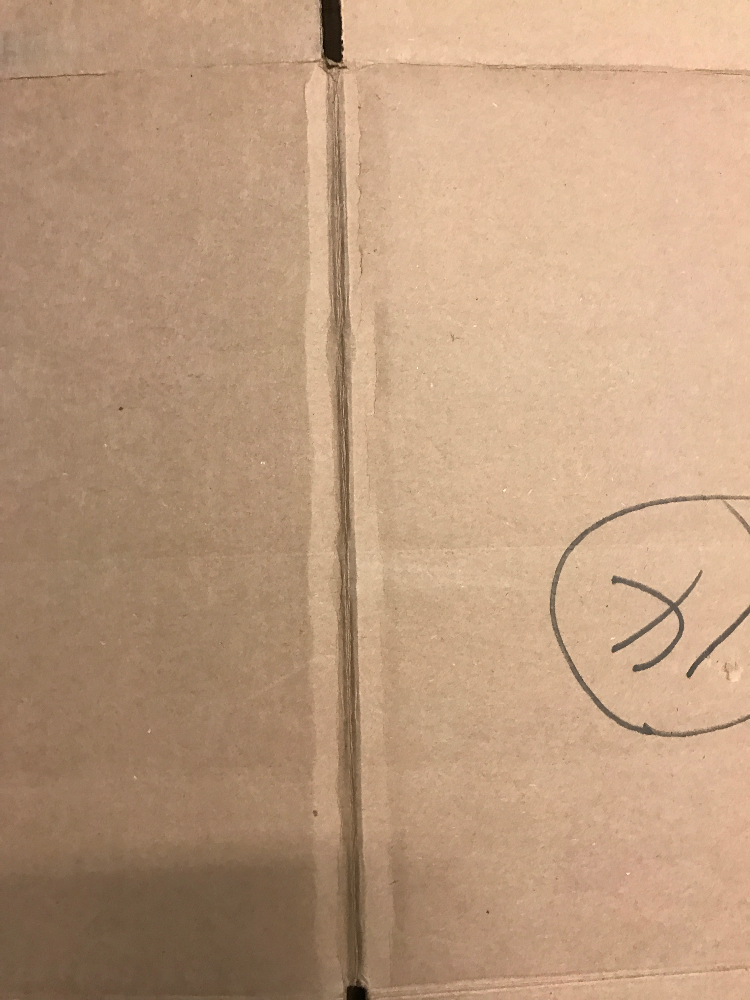

In [ ]:
dataset["train"][0]["image"]

KeyboardInterrupt: 

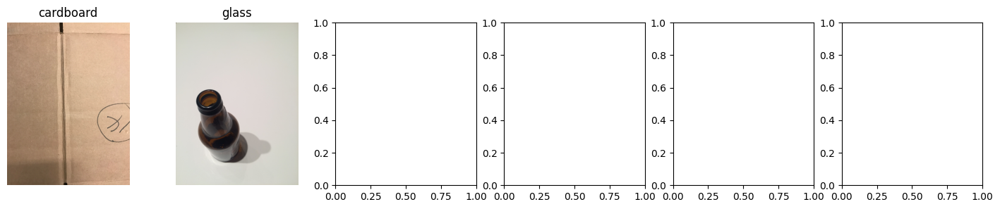

In [ ]:
import matplotlib.pyplot as plt

label_names = dataset["train"].features["label"].names
fig, axes = plt.subplots(1, 6, figsize=(18, 3))

for i, name in enumerate(label_names):
    # find the first image in the dataset matching this label
    for example in dataset["train"]:
        if example["label"] == i:
            axes[i].imshow(example["image"])
            axes[i].set_title(name)
            axes[i].axis("off")
            break

plt.show()


In [ ]:
labels = dataset["train"]["label"]

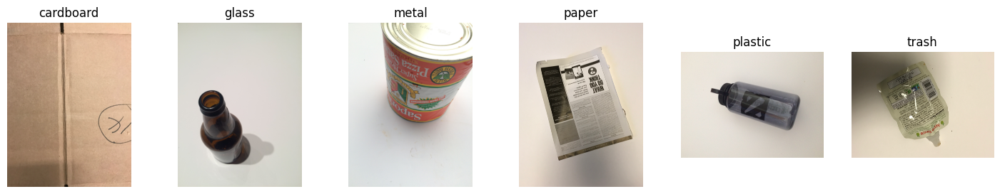

In [ ]:
import matplotlib.pyplot as plt

label_names = dataset["train"].features["label"].names
fig, axes = plt.subplots(1, 6, figsize=(18, 3))

for i, name in enumerate(label_names):
    idx = labels.index(i)
    axes[i].imshow(dataset["train"][idx]["image"])
    axes[i].set_title(name)
    axes[i].axis("off")

plt.show()

In [ ]:
split_dataset = dataset["train"].train_test_split(test_size=0.2, seed=42)
train_val = split_dataset["train"]
test_data = split_dataset["test"]

train_val_split = train_val.train_test_split(test_size=0.1, seed=42)
train_data = train_val_split["train"]
val_data = train_val_split["test"]

print("Train:", len(train_data))
print("Validation:", len(val_data))
print("Test:", len(test_data))

Train: 3638
Validation: 405
Test: 1011


In [ ]:
import numpy as np
from PIL import Image

IMG_SIZE = 224  # standard input size for MobileNetV2

def preprocess(example):
    img = example["image"].convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    example["image"] = np.array(img) / 255.0
    return example

train_data = train_data.map(preprocess)
val_data = val_data.map(preprocess)
test_data = test_data.map(preprocess)

print("Done preprocessing")

Map:   0%|          | 0/3638 [00:00<?, ? examples/s]

In [ ]:
!pip install datasets

In [ ]:
from datasets import load_dataset
dataset = load_dataset("garythung/trashnet")

In [ ]:
split_dataset = dataset["train"].train_test_split(test_size=0.2, seed=42)
train_val = split_dataset["train"]
test_data = split_dataset["test"]

train_val_split = train_val.train_test_split(test_size=0.1, seed=42)
train_data = train_val_split["train"]
val_data = train_val_split["test"]

print("Train:", len(train_data))
print("Validation:", len(val_data))
print("Test:", len(test_data))

Train: 3638
Validation: 405
Test: 1011


In [ ]:
import tensorflow as tf
import numpy as np

IMG_SIZE = 224
BATCH_SIZE = 32

def make_tf_dataset(hf_dataset, shuffle=False):
    def gen():
        for example in hf_dataset:
            img = example["image"].convert("RGB").resize((IMG_SIZE, IMG_SIZE))
            img_array = np.array(img) / 255.0
            yield img_array, example["label"]

    ds = tf.data.Dataset.from_generator(
        gen,
        output_signature=(
            tf.TensorSpec(shape=(IMG_SIZE, IMG_SIZE, 3), dtype=tf.float32),
            tf.TensorSpec(shape=(), dtype=tf.int64)
        )
    )
    if shuffle:
        ds = ds.shuffle(1000)
    ds = ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return ds

train_ds = make_tf_dataset(train_data, shuffle=True)
val_ds = make_tf_dataset(val_data)
test_ds = make_tf_dataset(test_data)

print("Datasets ready")

Datasets ready


In [ ]:
for images, labels_batch in train_ds.take(1):
    print("Batch shape:", images.shape)
    print("Labels:", labels_batch.numpy())

Batch shape: (32, 224, 224, 3)
Labels: [5 3 0 0 1 3 3 1 3 0 1 1 4 0 0 1 4 4 5 1 1 4 1 1 3 4 1 1 3 5 2 4]


In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models

base_model = MobileNetV2(input_shape=(IMG_SIZE, IMG_SIZE, 3), include_top=False, weights="imagenet")
base_model.trainable = False  # freeze pretrained layers

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation="relu"),
    layers.Dropout(0.3),
    layers.Dense(6, activation="softmax")  # 6 waste categories
])

model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,726 (9.24 MB)

 Trainable params: 164,742 (643.52 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
IMG_SIZE = 224
BATCH_SIZE = 32

def make_tf_dataset(hf_dataset, shuffle=False):
    def gen():
        for example in hf_dataset:
            img = example["image"].convert("RGB").resize((IMG_SIZE, IMG_SIZE))
            img_array = np.array(img) / 255.0
            yield img_array, example["label"]

    ds = tf.data.Dataset.from_generator(
        gen,
        output_signature=(
            tf.TensorSpec(shape=(IMG_SIZE, IMG_SIZE, 3), dtype=tf.float32),
            tf.TensorSpec(shape=(), dtype=tf.int64)
        )
    )
    ds = ds.cache()  # <-- new: decode once, reuse after
    if shuffle:
        ds = ds.shuffle(1000)
    ds = ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return ds

train_ds = make_tf_dataset(train_data, shuffle=True)
val_ds = make_tf_dataset(val_data)
test_ds = make_tf_dataset(test_data)

print("Datasets ready")

Datasets ready


In [ ]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=5
)

Epoch 1/5
    114/Unknown 572s 3s/step - accuracy: 0.5977 - loss: 1.0705

/usr/local/lib/python3.13/dist-packages/keras/src/trainers/epoch_iterator.py:164: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


114/114 ━━━━━━━━━━━━━━━━━━━━ 645s 4s/step - accuracy: 0.6932 - loss: 0.8072 - val_accuracy: 0.8099 - val_loss: 0.5124
Epoch 2/5
114/114 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.8263 - loss: 0.4688 - val_accuracy: 0.8346 - val_loss: 0.4684
Epoch 3/5
114/114 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - accuracy: 0.8782 - loss: 0.3385 - val_accuracy: 0.8469 - val_loss: 0.4369
Epoch 4/5
114/114 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.9043 - loss: 0.2667 - val_accuracy: 0.8642 - val_loss: 0.3530
Epoch 5/5
114/114 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.9233 - loss: 0.2065 - val_accuracy: 0.8741 - val_loss: 0.3381


In [ ]:
model.save("waste_classifier_model.h5")

In [ ]:
test_loss, test_accuracy = model.evaluate(test_ds)
print("Test accuracy:", test_accuracy)

32/32 ━━━━━━━━━━━━━━━━━━━━ 158s 5s/step - accuracy: 0.8793 - loss: 0.3596
Test accuracy: 0.8793274164199829


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
model.save("/content/drive/MyDrive/waste_classifier_model.keras")

Mounted at /content/drive


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model

model = load_model("/content/drive/MyDrive/waste_classifier_model.keras")


/usr/local/lib/python3.13/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 6 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Saving pb.jpg to pb.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
Prediction: plastic (91.3% confidence)


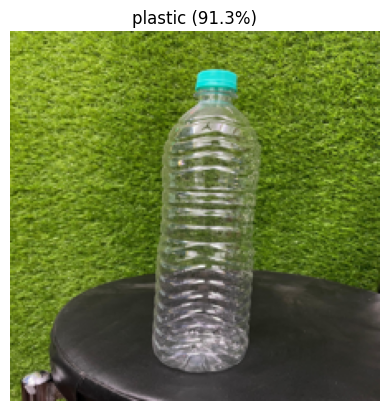

In [ ]:
import numpy as np
from PIL import Image
from google.colab import files

IMG_SIZE = 224
label_names = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

def predict_image(img_path):
    img = Image.open(img_path).convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    img_array = np.array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    predictions = model.predict(img_array)
    predicted_class = label_names[np.argmax(predictions)]
    confidence = np.max(predictions) * 100

    print(f"Prediction: {predicted_class} ({confidence:.1f}% confidence)")

    import matplotlib.pyplot as plt
    plt.imshow(img)
    plt.title(f"{predicted_class} ({confidence:.1f}%)")
    plt.axis("off")
    plt.show()

uploaded = files.upload()
for filename in uploaded.keys():
    predict_image(filename)

Saving gl.jpg to gl.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Prediction: glass (95.0% confidence)


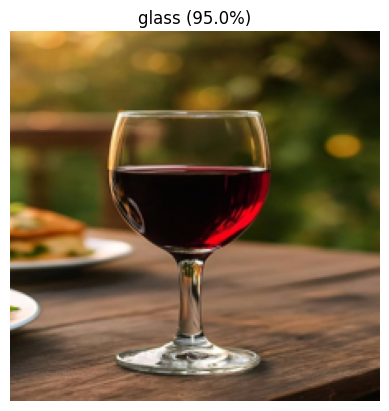

In [ ]:
import numpy as np
from PIL import Image
from google.colab import files

IMG_SIZE = 224
label_names = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

def predict_image(img_path):
    img = Image.open(img_path).convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    img_array = np.array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    predictions = model.predict(img_array)
    predicted_class = label_names[np.argmax(predictions)]
    confidence = np.max(predictions) * 100

    print(f"Prediction: {predicted_class} ({confidence:.1f}% confidence)")

    import matplotlib.pyplot as plt
    plt.imshow(img)
    plt.title(f"{predicted_class} ({confidence:.1f}%)")
    plt.axis("off")
    plt.show()

uploaded = files.upload()
for filename in uploaded.keys():
    predict_image(filename)

Saving mt.jpg to mt.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Prediction: plastic (82.3% confidence)


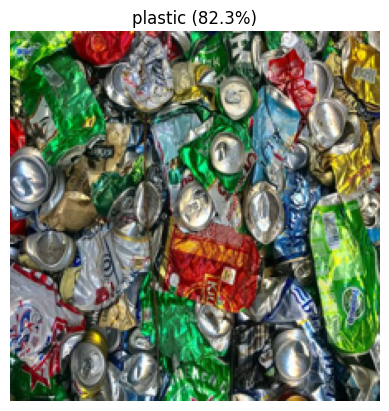

In [ ]:
import numpy as np
from PIL import Image
from google.colab import files

IMG_SIZE = 224
label_names = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

def predict_image(img_path):
    img = Image.open(img_path).convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    img_array = np.array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    predictions = model.predict(img_array)
    predicted_class = label_names[np.argmax(predictions)]
    confidence = np.max(predictions) * 100

    print(f"Prediction: {predicted_class} ({confidence:.1f}% confidence)")

    import matplotlib.pyplot as plt
    plt.imshow(img)
    plt.title(f"{predicted_class} ({confidence:.1f}%)")
    plt.axis("off")
    plt.show()

uploaded = files.upload()
for filename in uploaded.keys():
    predict_image(filename)


Saving tr.jpg to tr.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Prediction: metal (79.4% confidence)


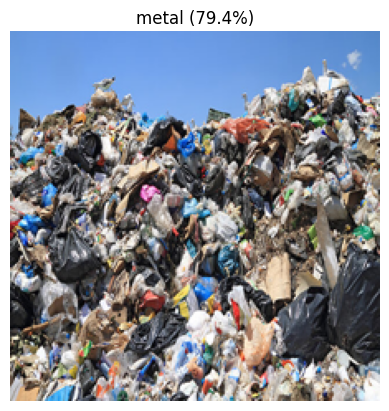

In [ ]:
import numpy as np
from PIL import Image
from google.colab import files

IMG_SIZE = 224
label_names = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

def predict_image(img_path):
    img = Image.open(img_path).convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    img_array = np.array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    predictions = model.predict(img_array)
    predicted_class = label_names[np.argmax(predictions)]
    confidence = np.max(predictions) * 100

    print(f"Prediction: {predicted_class} ({confidence:.1f}% confidence)")

    import matplotlib.pyplot as plt
    plt.imshow(img)
    plt.title(f"{predicted_class} ({confidence:.1f}%)")
    plt.axis("off")
    plt.show()

uploaded = files.upload()
for filename in uploaded.keys():
    predict_image(filename)

Saving p.jpg to p.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Prediction: glass (44.4% confidence)


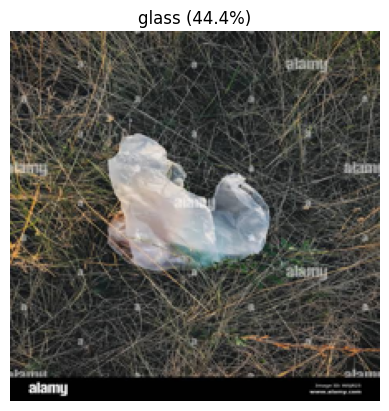

In [ ]:
import numpy as np
from PIL import Image
from google.colab import files

IMG_SIZE = 224
label_names = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

def predict_image(img_path):
    img = Image.open(img_path).convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    img_array = np.array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    predictions = model.predict(img_array)
    predicted_class = label_names[np.argmax(predictions)]
    confidence = np.max(predictions) * 100

    print(f"Prediction: {predicted_class} ({confidence:.1f}% confidence)")

    import matplotlib.pyplot as plt
    plt.imshow(img)
    plt.title(f"{predicted_class} ({confidence:.1f}%)")
    plt.axis("off")
    plt.show()

uploaded = files.upload()
for filename in uploaded.keys():
    predict_image(filename)

In [ ]:
!ls /content/drive/MyDrive/waste_classifier_model.keras


/content/drive/MyDrive/waste_classifier_model.keras


In [1]:
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [3]:
import tensorflow as tf
from tensorflow.keras.models import load_model

model = load_model("/content/drive/MyDrive/waste_classifier_model.keras")

/usr/local/lib/python3.13/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 6 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [4]:
IMG_SIZE = 224
label_names = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

Saving pb.jpg to pb.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
Prediction: plastic (91.3% confidence)


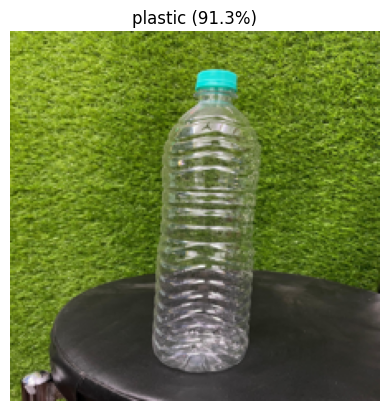

In [5]:
import numpy as np
from PIL import Image
from google.colab import files

def predict_image(img_path):
    img = Image.open(img_path).convert("RGB").resize((IMG_SIZE, IMG_SIZE))
    img_array = np.array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    predictions = model.predict(img_array)
    predicted_class = label_names[np.argmax(predictions)]
    confidence = np.max(predictions) * 100

    print(f"Prediction: {predicted_class} ({confidence:.1f}% confidence)")

    import matplotlib.pyplot as plt
    plt.imshow(img)
    plt.title(f"{predicted_class} ({confidence:.1f}%)")
    plt.axis("off")
    plt.show()

uploaded = files.upload()
for filename in uploaded.keys():
    predict_image(filename)